# Interactive Plotting

Why would we want to make plots interactive?
- __For our own personal use:__ often helpful to visualize things and be able to adjust the graphs in some way.
- __For use in presentations:__ useful for demonstrating trends in a presentation.
- __For use as an app:__ can deploy the results of an analysis as an app to make it interactive!

Here I will demonstrate using both `matplotlib` and `plotly` to make plots interactive.


### Matplotlib with Widgets

In [1]:
import matplotlib.pyplot as plt
%matplotlib notebook
from matplotlib.widgets import Slider, Button, RadioButtons

In this example, I wanted to make a graph of an asset replacement rule. Here I compare two different payoff functions for the immediate period: one has the probability of the asset breaking down and failing and the other does not.

The payoffs depend on asset age, output price, replacement price, and the "penalty" from the asset failing. The production function is simply quadratic in age. 

The payoff for replacement of the asset without failure is $$ py(1) - py(a+1)-c$$,

and with probability if failure $S(a)$ it is $$(1-S(a))\alpha + S(a)(py(1) - py(a+1) -c)$$

The idea of the graph was to be able to isolate the effect of $\alpha$ on the decision rule in combination with $p$ and $c$.

This interactive plot very simply just uses sliders for changing parameters.

<IPython.core.display.Javascript object>


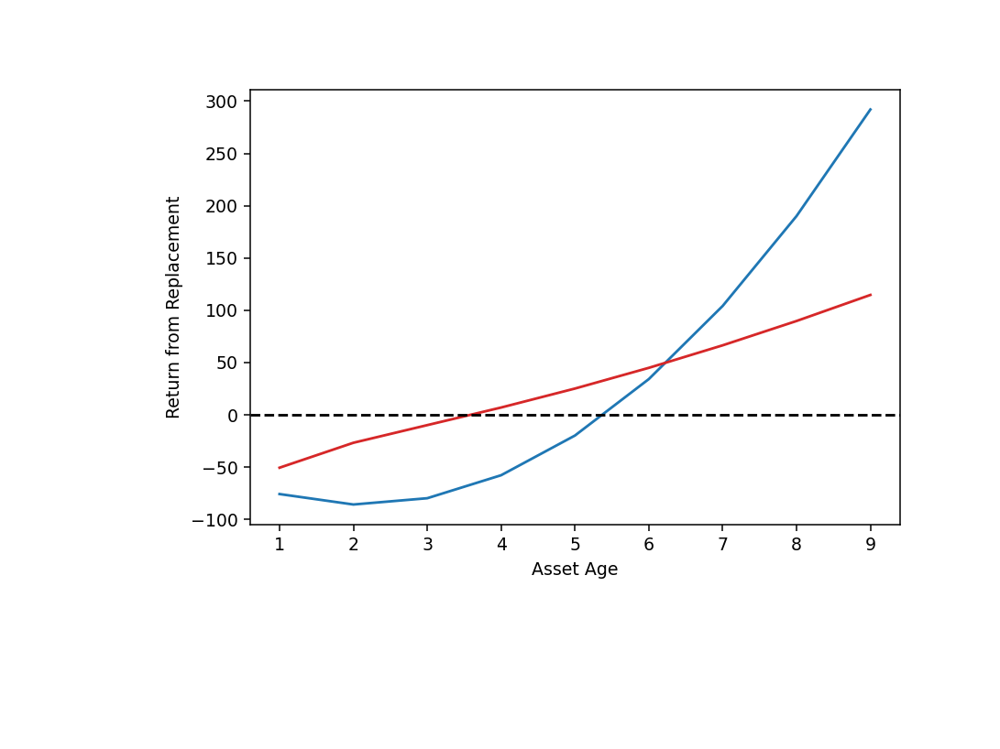

Text(0, 0.5, 'Return from Replacement')

In [2]:
# Parameters
b0=0
b1=5
b2=-.8
d= .8
k=-.5

# Functions
y = lambda a: b0+b1*a+ b2*a**2
S = lambda a: d*a**(k)

# Payoffs
def payoff_no_penalty(a,p,c):
    return p*y(1) - p*y(a+1) -c

def payoff_with_penalty(a,p,c,alpha):
    return (1-S(a))*alpha + S(a)*(p*y(1) - p*y(a+1) -c)

# Starting Values
p=10
c=50
alpha=50

fig, ax = plt.subplots(figsize=(8,6))
plt.subplots_adjust(left=0.25, bottom=0.3)

no_penal, = plt.plot(list(range(1,10)),[payoff_no_penalty(a,p,c) for a in range(1,10)],color='C0',label='Without Failure')
yes_penal, = plt.plot(list(range(1,10)),[payoff_with_penalty(a,p,c,alpha) for a in range(1,10)],label='With Failure',color='C3')
plt.axhline(0,ls='--',color='black')

plt.xlabel('Asset Age')
plt.ylabel('Return from Replacement')


<IPython.core.display.Javascript object>


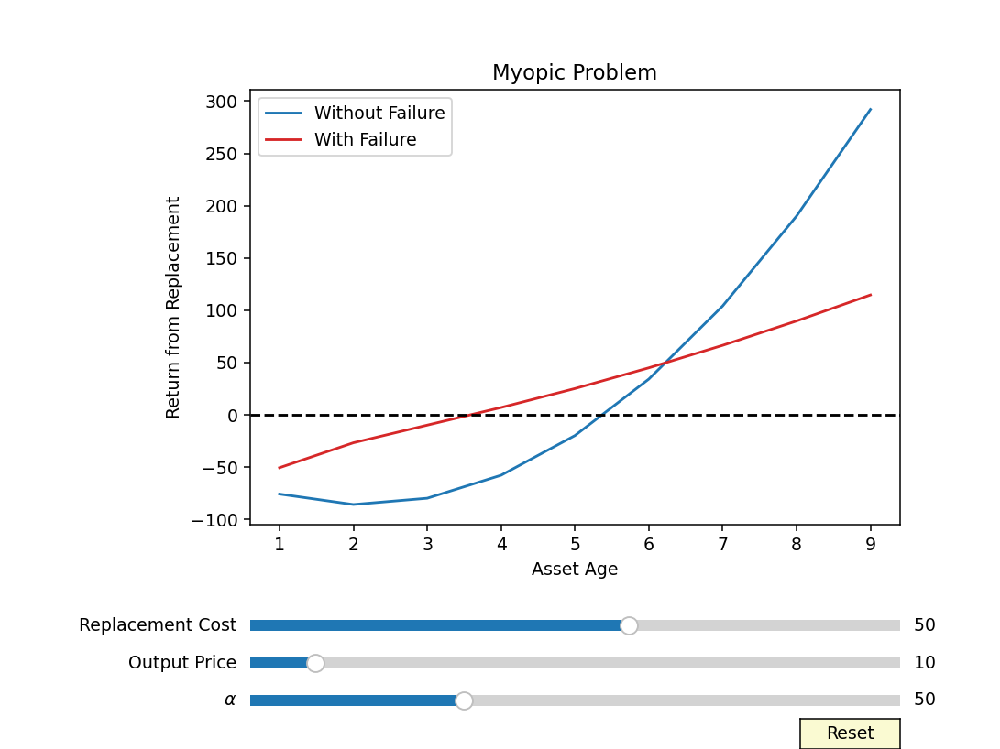

In [3]:
# Parameters
b0=0
b1=5
b2=-.8
d= .8
k=-.5

# Functions
y = lambda a: b0+b1*a+ b2*a**2
S = lambda a: d*a**(k)

# Payoffs
def payoff_no_penalty(a,p,c):
    return p*y(1) - p*y(a+1) -c

def payoff_with_penalty(a,p,c,alpha):
    return (1-S(a))*alpha + S(a)*(p*y(1) - p*y(a+1) -c)

# Starting Values
p=10
c=50
alpha=50

fig, ax = plt.subplots(figsize=(8,6))
plt.subplots_adjust(left=0.25, bottom=0.3)

no_penal, = plt.plot(list(range(1,10)),[payoff_no_penalty(a,p,c) for a in range(1,10)],color='C0',label='Without Failure')
yes_penal, = plt.plot(list(range(1,10)),[payoff_with_penalty(a,p,c,alpha) for a in range(1,10)],label='With Failure',color='C3')
plt.axhline(0,ls='--',color='black')

plt.xlabel('Asset Age')
plt.ylabel('Return from Replacement')

#### This is the part that makes it interactive:

axcolor = 'lightgoldenrodyellow'
ax1 = plt.axes([0.25, 0.1, 0.65, 0.03])
ax2 = plt.axes([0.25, 0.15, 0.65, 0.03])
ax3 = plt.axes([0.25, 0.05, 0.65, 0.03])

s1 = Slider(ax1, 'Output Price', 0, 100, valinit=p)
s2 = Slider(ax2, 'Replacement Cost', -20, 100, valinit=c)
s3 = Slider(ax3, r'$\alpha$', 1, 150, valinit=alpha)


def update(val):
    p_ = int(s1.val)
    c_ = int(s2.val)
    alpha_ = int(s3.val)
    no_penal.set_ydata([payoff_no_penalty(a,p_,c_) for a in range(1,10)])
    yes_penal.set_ydata([payoff_with_penalty(a,p_,c_,alpha_) for a in range(1,10)])
    s1.valtext.set_text('{}'.format(p_))
    s2.valtext.set_text('{}'.format(c_))
    s3.valtext.set_text('{}'.format(alpha_))
    #ax.relim()
    #ax.autoscale_view()
    fig.canvas.draw_idle()

s1.on_changed(update)
s2.on_changed(update)
s3.on_changed(update)

resetax = plt.axes([0.8, 0.0005, 0.1, 0.04])
button = Button(resetax, 'Reset', color=axcolor, hovercolor='0.975')

def reset(event):
    s1.reset()
    s2.reset()
    s3.reset()
button.on_clicked(reset)
ax.legend(loc="upper left", bbox_to_anchor=(0,1))
plt.show()
# plt.savefig("../../figs/Figure1.png",bbox_inches='tight',dpi=150)
ax.set_title("Myopic Problem");

There are other examples of "widgets" than can be put into matplotlib to make the figures have other properties.

For example, here's one with radio buttons:

<IPython.core.display.Javascript object>


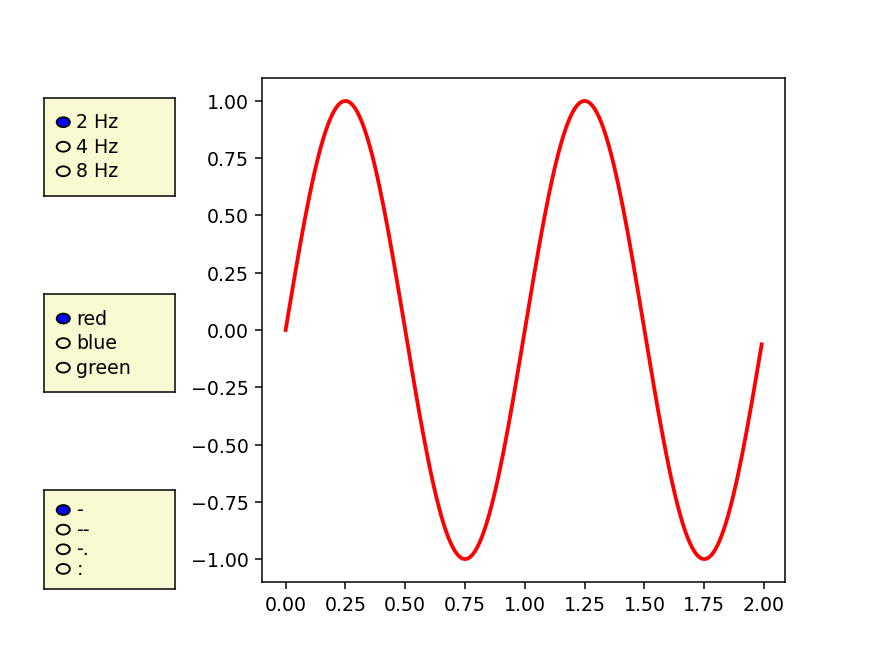

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import RadioButtons

## Set up the data
t = np.arange(0.0, 2.0, 0.01)
s0 = np.sin(2*np.pi*t)
s1 = np.sin(4*np.pi*t)
s2 = np.sin(8*np.pi*t)

fig, ax = plt.subplots()
l, = ax.plot(t, s0, lw=2, color='red')
plt.subplots_adjust(left=0.3)

## Make some radio button axes for placing things
axcolor = 'lightgoldenrodyellow'

## For each radio button, make a function that updates the data
rax = plt.axes([0.05, 0.7, 0.15, 0.15], facecolor=axcolor)
radio = RadioButtons(rax, ('2 Hz', '4 Hz', '8 Hz'))


def hzfunc(label):
    # The dictionary stores the new data.
    hzdict = {'2 Hz': s0, '4 Hz': s1, '8 Hz': s2}
    ydata = hzdict[label]
    
    # This sets new data.
    l.set_ydata(ydata)
    
    # This draws the graph again.
    plt.draw()
# This calls the function each time you click.
radio.on_clicked(hzfunc)

rax = plt.axes([0.05, 0.4, 0.15, 0.15], facecolor=axcolor)
radio2 = RadioButtons(rax, ('red', 'blue', 'green'))


def colorfunc(label):
    l.set_color(label)
    plt.draw()
radio2.on_clicked(colorfunc)

rax = plt.axes([0.05, 0.1, 0.15, 0.15], facecolor=axcolor)
radio3 = RadioButtons(rax, ('-', '--', '-.', ':'))


def stylefunc(label):
    l.set_linestyle(label)
    plt.draw()
radio3.on_clicked(stylefunc)

plt.show()

## Plotly Interactive Plotting

Plotly is perhaps the most advanced and easy to use for good looking plots in Python. In combination with dash, its also very easy to deploy them as apps.

Let's demonstrate with some data.

### Plotly Express

The fastest figures in plotly can by done using the plotly express:

In [19]:
import pandas as pd
data_dir = "C:/Users/jhtchns2/Box/ACE_592_SAE/Class_Examples/4_Analysis/"
df = pd.read_csv(data_dir+"naab_example.csv")

In [20]:
import plotly.express as px
fig = px.scatter(df, x="pta_milk", y="pta_dpr", color="breed",title="Milk versus Fertility",opacity=.7)
fig.show()

This graph shows the assocation between fertility and milk production, which tend to be tradeoffs in animal genetics.

Note that this is already interactive. You can hover over points and even zoom in.

It is fairly simple in this app to do a time dimension slider:

In [7]:
milk_dpr = df[['pta_milk','pta_dpr','breed','eval_period']].dropna()

In [8]:
fig = px.scatter(milk_dpr, x="pta_milk", y="pta_dpr", color="breed",title="A Plotly Express Figure",opacity=.7,\
                 animation_frame="eval_period",range_y=(-8,9),range_x=(-2500,5500))
fig.show()

The take home message here: dairy genetics got more productive but also more variable over time.

Another example of an easy to use plot is the treemap. This one uses life expectancy data and can actually nest treemaps:

In [23]:
df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
11,Afghanistan,Asia,2007,43.828,31889923,974.580338,AFG,4
23,Albania,Europe,2007,76.423,3600523,5937.029526,ALB,8
35,Algeria,Africa,2007,72.301,33333216,6223.367465,DZA,12
47,Angola,Africa,2007,42.731,12420476,4797.231267,AGO,24
59,Argentina,Americas,2007,75.320,40301927,12779.379640,ARG,32
...,...,...,...,...,...,...,...,...
1655,Vietnam,Asia,2007,74.249,85262356,2441.576404,VNM,704
1667,West Bank and Gaza,Asia,2007,73.422,4018332,3025.349798,PSE,275
1679,"Yemen, Rep.",Asia,2007,62.698,22211743,2280.769906,YEM,887
1691,Zambia,Africa,2007,42.384,11746035,1271.211593,ZMB,894


In [25]:
df = px.data.gapminder().query("year == 2007")
fig = px.treemap(df, path=[px.Constant('world'), 'continent', 'country'], values='gdpPercap',
                  color='lifeExp', hover_data=['iso_alpha'])
fig.show()

### Building your own plots

There is some real advantages to building your own graphs using plotly. It is also a little bit easier to use than the matplotlib widgets (and better looking too!).

Here is an interactive plot of a surface.

In [26]:
import plotly.graph_objects as go

import pandas as pd

# load dataset
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/volcano.csv")

# create figure
fig = go.Figure()

# Add surface trace
fig.add_trace(go.Surface(z=df.values.tolist(), colorscale="Viridis"))

# Update plot sizing
fig.update_layout(
    width=600,
    height=500,
    autosize=False,
    margin=dict(t=0, b=0, l=0, r=0),
    template="plotly_white",
)

# Update 3D scene options
fig.update_scenes(
    aspectratio=dict(x=1, y=1, z=0.7),
    aspectmode="manual"
)

fig.show()

You can add drop down options similar to matplotlib widgets, but the set up is a little different:

In [27]:

# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction = "left",
            buttons=list([
                dict(
                    args=["type", "surface"], # Tell it which argument to fill it with and what to put.
                    label="3D Surface", # Give the button a label
                    method="restyle" # the "restyle" method will redraw the plot and update the arguments.
                ),
                dict(
                    args=["type", "heatmap"],
                    label="Heatmap",
                    method="restyle"
                )
            ]),
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.11,
            xanchor="left",
            y=1.1,
            yanchor="top"
        ),
    ]
)

# Add annotation
fig.update_layout(
    annotations=[
        dict(text="Type:", showarrow=False,
                             x=0, y=1.08, yref="paper", align="left")
    ]
)


Another example of using a lot of buttons:

In [28]:
import plotly.graph_objects as go

import pandas as pd

# load dataset
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/volcano.csv")

# Create figure
fig = go.Figure()

# Add surface trace
fig.add_trace(go.Heatmap(z=df.values.tolist(), colorscale="Viridis"))

# Update plot sizing
fig.update_layout(
    width=800,
    height=900,
    autosize=False,
    margin=dict(t=100, b=0, l=0, r=0),
)

# Update 3D scene options
fig.update_scenes(
    aspectratio=dict(x=1, y=1, z=0.7),
    aspectmode="manual"
)

# This one adds all of the buttons
button_layer_1_height = 1.12
button_layer_2_height = 1.065

fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["colorscale", "Viridis"], # This is the argument it is updating
                    label="Viridis", # This is the label for the button
                    method="restyle"
                ),
                dict(
                    args=["colorscale", "Cividis"],
                    label="Cividis",
                    method="restyle"
                ),
                dict(
                    args=["colorscale", "Blues"],
                    label="Blues",
                    method="restyle"
                ),
                dict(
                    args=["colorscale", "Greens"],
                    label="Greens",
                    method="restyle"
                ),
            ]),
            type = "buttons",
            direction="right",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.1,
            xanchor="left",
            y=button_layer_1_height,
            yanchor="top"
        ),
        dict(
            buttons=list([
                dict(
                    args=["reversescale", False],
                    label="False",
                    method="restyle"
                ),
                dict(
                    args=["reversescale", True],
                    label="True",
                    method="restyle"
                )
            ]),
            type = "buttons",
            direction="right",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.13,
            xanchor="left",
            y=button_layer_2_height,
            yanchor="top"
        ),
        dict(
            buttons=list([
                dict(
                    args=[{"contours.showlines": False, "type": "contour"}],
                    label="Hide lines",
                    method="restyle"
                ),
                dict(
                    args=[{"contours.showlines": True, "type": "contour"}],
                    label="Show lines",
                    method="restyle"
                ),
            ]),
            type = "buttons",
            direction="right",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.5,
            xanchor="left",
            y=button_layer_2_height,
            yanchor="top"
        ),
    ]
)

## Puts some text annotations next to the buttons.

fig.update_layout(
    annotations=[
        dict(text="colorscale", x=0, xref="paper", y=1.1, yref="paper",
                             align="left", showarrow=False),
        dict(text="Reverse<br>Colorscale", x=0, xref="paper", y=1.06,
                             yref="paper", showarrow=False),
        dict(text="Lines", x=0.47, xref="paper", y=1.045, yref="paper",
                             showarrow=False)
    ])

### Mapping with Plotly

Using a geojson file and a dataframe, you can make interactive plots in plotly as well.

The key to link one geojson file to one dataframe is to use the "locations" and "featureidkey" fields to merge them on a common index:

In [15]:
import plotly.express as px

df = px.data.election()
geojson = px.data.election_geojson()


In [17]:
fig = px.choropleth(df, geojson=geojson, color="Bergeron",
                    locations="district", featureidkey="properties.district",
                    projection="mercator"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Deploying Graphs

Plotly objects are partly written in JavaScript, which is why they are interactive. Because of this, they can be deployed to websites so people can interact with them.

__NOTE__: web deployment is a whole field by itself. If you feel this is essential to your work, consider hiring someone to really advise you on how to do this.

Still, it is within our ability to deploy a very simple app for free.

Some ways to do it:
- Deploy your own app on your own server (more work).
- Deploy it using Heroku (easier).
- Deploy it using Jupyter Hub (easy, but only deploys to a limited audience).

Using Heroku is fairly straightforward. To do this method, you just need to upload your plotly script into a special git repository.

[Tutorial can be found here](https://dash.plotly.com/deployment)
